<a href="https://colab.research.google.com/github/yonggang-Xie/Histogram_Equalization/blob/main/Histogram_Equalization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!git clone https://github.com/yonggang-Xie/Histogram_Equalization

Cloning into 'Histogram_Equalization'...
remote: Enumerating objects: 3, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (2/2), done.
remote: Total 3 (delta 0), reused 0 (delta 0), pack-reused 0
Receiving objects: 100% (3/3), 292.49 KiB | 5.52 MiB/s, done.


In [2]:
%cd ./Histogram_Equalization

/content/Histogram_Equalization


In [3]:
import zipfile
def unzip_file(zip_filepath, dest_directory):
    with zipfile.ZipFile(zip_filepath, 'r') as zip_ref:
        zip_ref.extractall(dest_directory)

# Example usage
zip_path = './sample images.zip'
destination = './assignment1_images'
unzip_file(zip_path, destination)


# Possible Improvements (Working Code)

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import glob
import os

# core code for histogram equalization
def manual_histogram_equalization(channel):
    # Compute the histogram
    hist, _ = np.histogram(channel.flatten(), 256, [0,256])

    # Compute the CDF
    cdf = hist.cumsum()

    # Normalize the CDF to [0, 255]
    cdf_normalized = (cdf - cdf.min()) * 255 / (cdf.max() - cdf.min())

    # Map the original pixel values to the equalized values
    equalized_channel = cdf_normalized[channel]

    return equalized_channel.astype(channel.dtype)

def histogram_equalization(img_path, output_path):
    img = cv2.imread(img_path)

    # Convert to YCbCr color space
    ycrcb = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    y, cr, cb = cv2.split(ycrcb)

    # Apply manual histogram equalization on Y channel
    y_equ = manual_histogram_equalization(y)

    # Merge channels back
    ycrcb_equ = cv2.merge([y_equ, cr, cb])
    img_equ = cv2.cvtColor(ycrcb_equ, cv2.COLOR_YCrCb2BGR)

    cv2.imwrite(output_path, img_equ)

def ahe_enhancement(img_path, output_path, tile_grid_size=(8,8)):
    img = cv2.imread(img_path)

    # Convert to YCbCr color space
    ycrcb = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    y, cr, cb = cv2.split(ycrcb)

    # Apply AHE on Y channel
    clahe = cv2.createCLAHE(clipLimit=0, tileGridSize=tile_grid_size)
    y_equ = clahe.apply(y)

    # Merge channels back
    ycrcb_equ = cv2.merge([y_equ, cr, cb])
    img_equ = cv2.cvtColor(ycrcb_equ, cv2.COLOR_YCrCb2BGR)
    cv2.imwrite(output_path, img_equ)

def clahe_enhancement(img_path, output_path, clip_limit=3, tile_grid_size=(8,8)):
    img = cv2.imread(img_path)

    # Convert to YCbCr color space
    ycrcb = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    y, cr, cb = cv2.split(ycrcb)

    # Apply CLAHE on Y channel
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
    y_equ = clahe.apply(y)

    # Merge channels back
    ycrcb_equ = cv2.merge([y_equ, cr, cb])
    img_equ = cv2.cvtColor(ycrcb_equ, cv2.COLOR_YCrCb2BGR)
    cv2.imwrite(output_path, img_equ)

def he_hsv(img_path, output_path):
    img = cv2.imread(img_path)

    # Convert image to HSV
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv)

    # Apply manual histogram equalization on the V channel
    v_equ = manual_histogram_equalization(v)

    # Merge channels back
    hsv_equ = cv2.merge([h, s, v_equ])
    img_equ = cv2.cvtColor(hsv_equ, cv2.COLOR_HSV2BGR)

    cv2.imwrite(output_path, img_equ)

def regularized_he(img_path, output_path, alpha=0.7):
    img = cv2.imread(img_path)

    # Convert to YCbCr color space
    ycrcb = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    y, cr, cb = cv2.split(ycrcb)

    # Apply manual histogram equalization on Y channel
    y_equ = manual_histogram_equalization(y)

    # Regularize by taking a weighted sum of original and equalized Y channel
    y_regularized = cv2.addWeighted(y, alpha, y_equ, 1 - alpha, 0)

    # Merge channels back
    ycrcb_equ = cv2.merge([y_regularized, cr, cb])
    img_equ = cv2.cvtColor(ycrcb_equ, cv2.COLOR_YCrCb2BGR)

    cv2.imwrite(output_path, img_equ)

def exponential_he(img_path, output_path):
    img = cv2.imread(img_path)

    # Convert to YCbCr color space
    ycrcb = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    y, cr, cb = cv2.split(ycrcb)

    # Calculate histogram for Y channel
    hist, bins = np.histogram(y.flatten(), 256, [0,256])

    # Calculate cumulative distribution function (CDF)
    cdf = hist.cumsum()
    cdf_normalized = cdf * hist.max() / cdf.max()

    # Exponential transformation
    cdf_m = np.ma.masked_equal(cdf, 0)
    cdf_m = (cdf_m - cdf_m.min()) * 255 / (cdf_m.max() - cdf_m.min())
    cdf_m = 255 * (1 - np.exp(-cdf_m / 255))

    # Apply the transformation to Y channel
    y_exp = cdf_m[y]
    y_exp = y_exp.astype(y.dtype)

    # Merge channels back
    ycrcb_exp = cv2.merge([y_exp, cr, cb])
    img_exp = cv2.cvtColor(ycrcb_exp, cv2.COLOR_YCrCb2BGR)

    cv2.imwrite(output_path, img_exp)


# Output Visualization

Processing: assignment1_images/sample02


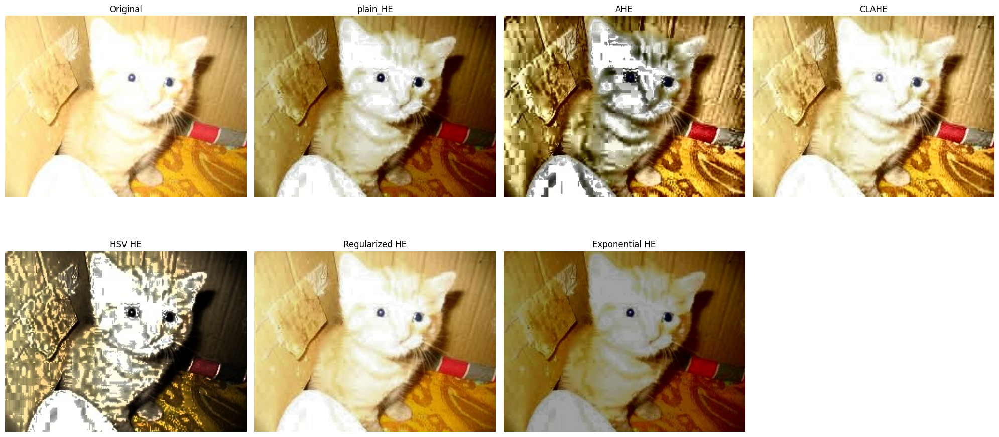

Processing: assignment1_images/sample06


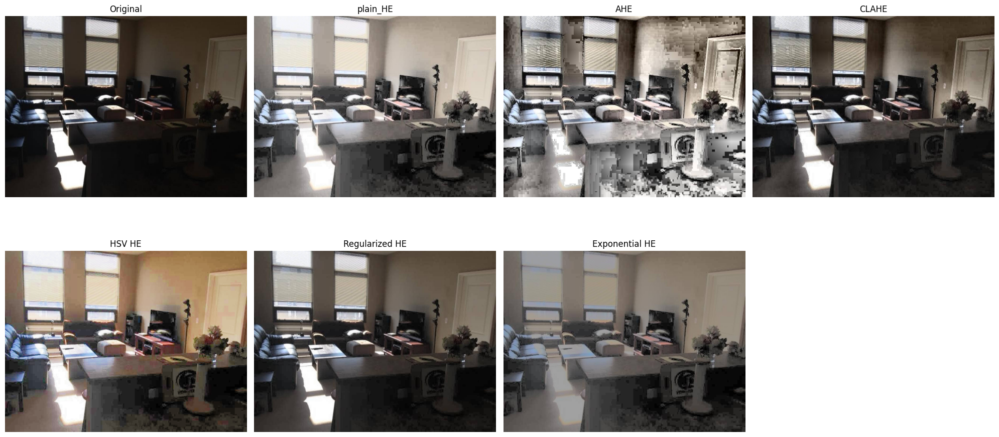

Processing: assignment1_images/sample04


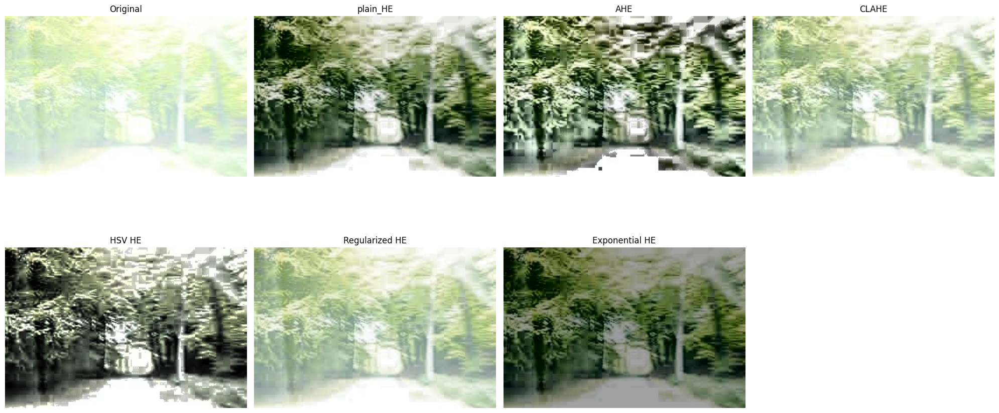

Processing: assignment1_images/sample07


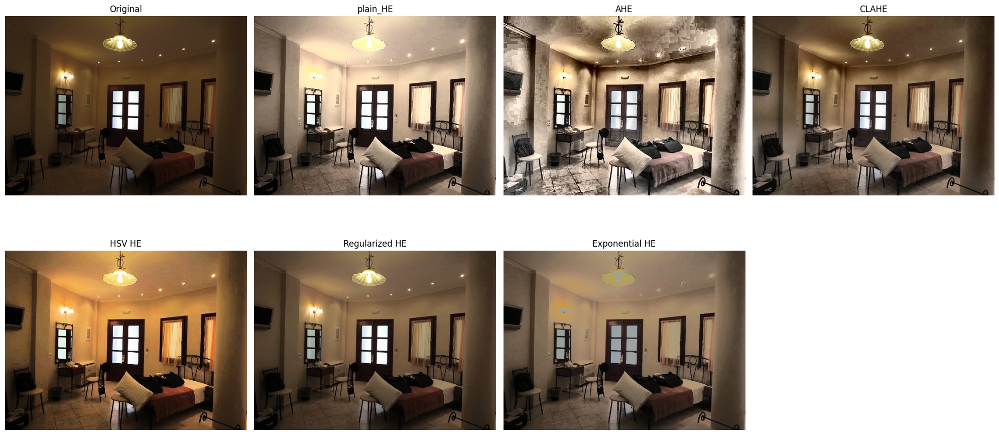

Processing: assignment1_images/sample03


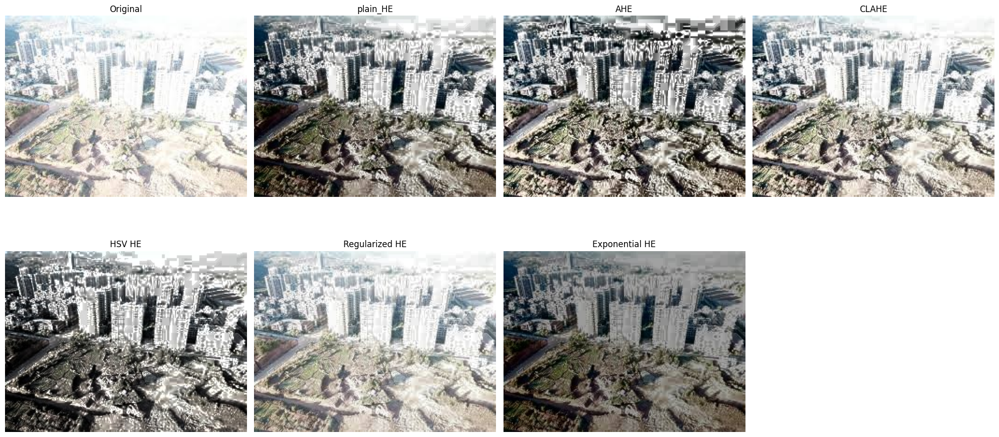

Processing: assignment1_images/sample01


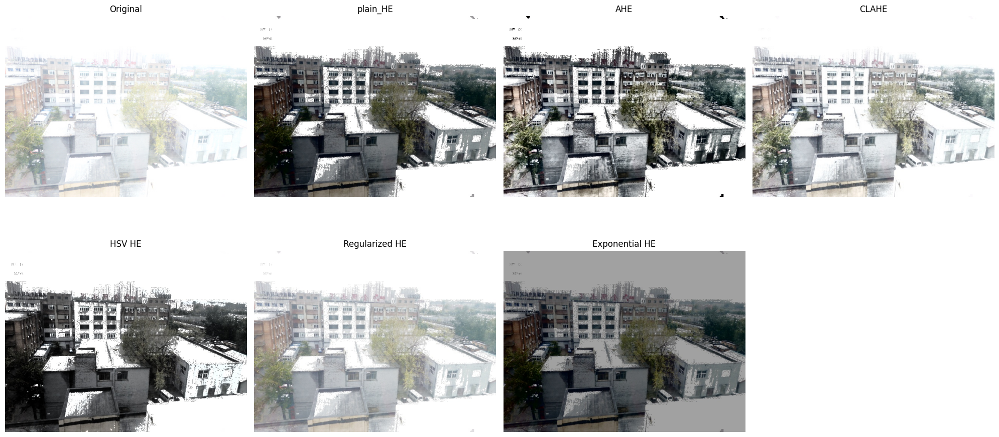

Processing: assignment1_images/sample05


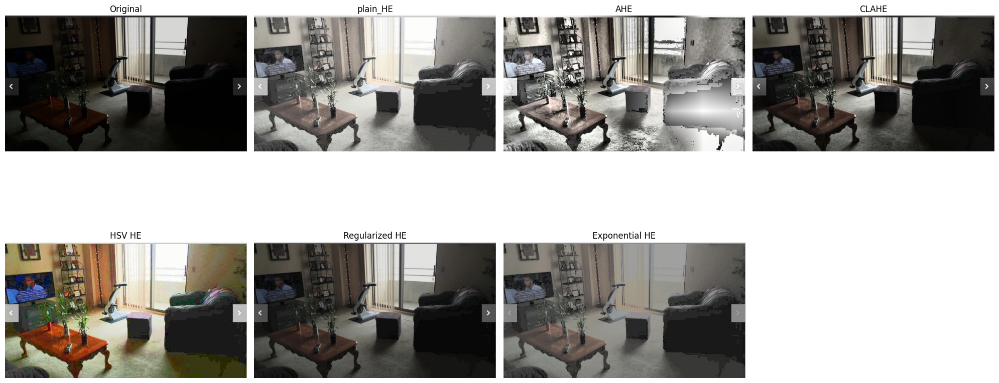

Processing: assignment1_images/sample08


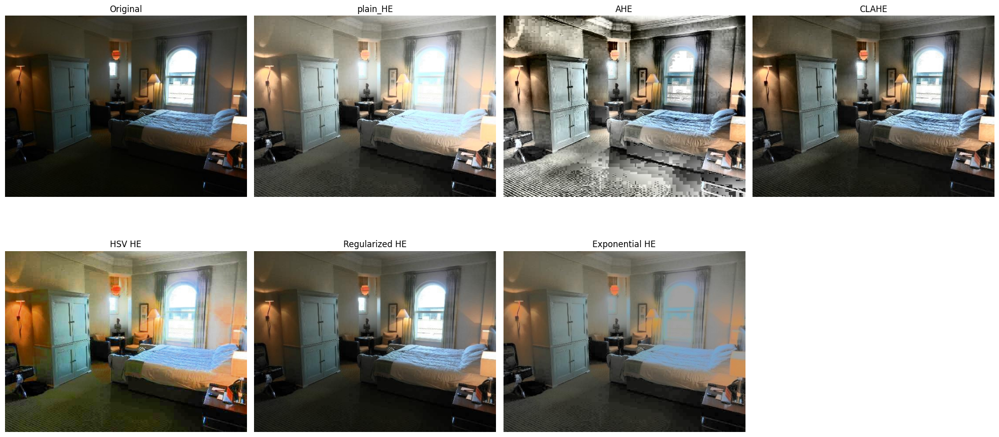

In [12]:
img_dir = 'assignment1_images'
out_dir ='output_images'
if not os.path.isdir(out_dir):
  os.makedirs(out_dir)

file_list = glob.glob(img_dir + '/*')
methods = {
    'plain_HE': histogram_equalization,
    "AHE": ahe_enhancement,
    "CLAHE": clahe_enhancement,
    "HSV HE": he_hsv,
    "Regularized HE": regularized_he,
    "Exponential HE": exponential_he
}
for file_name in file_list:
    fn = file_name.split('.')[0]
    print('Processing:', fn)
    image_name = fn.split('/')[-1]

    # Original Image
    original = cv2.imread(file_name, cv2.IMREAD_COLOR)
    original = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)  # Convert to RGB for proper display with matplotlib

    enhanced_images = {"Original": original}  # This will reset the dictionary for each new file

    for method_name, method_func in methods.items():
        out_image_path = os.path.join(out_dir, f'{image_name}_{method_name.replace(" ", "_")}.jpg')
        method_func(file_name, out_image_path)

        img = cv2.imread(out_image_path, cv2.IMREAD_COLOR)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        enhanced_images[method_name] = img  # Use method_name directly as the key

    # Display all images
    plt.figure(figsize=(20, 10))

    for idx, (title, img) in enumerate(enhanced_images.items()):
        plt.subplot(2, 4, idx + 1)
        plt.imshow(img)
        plt.title(title)
        plt.axis('off')  # Hide axis for better visualization

    plt.tight_layout()
    plt.show()
